# HOG and LBP Feature Extraction Assignment

This notebook implements HOG (Histogram of Oriented Gradients) and LBP (Local Binary Patterns) feature extraction techniques for image processing.

## Table of Contents
1. [HOG Features](#hog-features)
2. [Local Binary Patterns](#local-binary-patterns)

In [29]:
# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage import data, exposure, feature
from skimage.color import rgb2gray
from skimage.transform import resize
import os
import urllib.request
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

## HOG Features

### Task 1: HOG Feature Extraction Function

First, let's implement a function to compute HOG features of a given image using scikit-image.

In [30]:
def compute_hog_features(image, orientations=9, pixels_per_cell=(8, 8), 
                        cells_per_block=(2, 2), visualize=True, feature_vector=True):
    """
    Compute HOG (Histogram of Oriented Gradients) features for an image.
    
    Parameters:
    - image: Input image (grayscale)
    - orientations: Number of orientation bins
    - pixels_per_cell: Size (in pixels) of a cell
    - cells_per_block: Number of cells in each block
    - visualize: Whether to return HOG image for visualization
    - feature_vector: Whether to return features as a flattened vector
    
    Returns:
    - features: HOG feature descriptor
    - hog_image: HOG visualization image (if visualize=True)
    """
    
    # Convert to grayscale if image is RGB
    if len(image.shape) == 3:
        image = rgb2gray(image)
    
    # Compute HOG features
    if visualize:
        features, hog_image = feature.hog(image, 
                                        orientations=orientations,
                                        pixels_per_cell=pixels_per_cell,
                                        cells_per_block=cells_per_block,
                                        visualize=visualize,
                                        feature_vector=feature_vector)
        return features, hog_image
    else:
        features = feature.hog(image, 
                             orientations=orientations,
                             pixels_per_cell=pixels_per_cell,
                             cells_per_block=cells_per_block,
                             visualize=visualize,
                             feature_vector=feature_vector)
        return features

def compute_gradient_image(image):
    """
    Compute gradient magnitude and direction for visualization.
    """
    if len(image.shape) == 3:
        image = rgb2gray(image)
    
    # Compute gradients using Sobel operators
    grad_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
    grad_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
    
    # Compute magnitude and direction
    magnitude = np.sqrt(grad_x**2 + grad_y**2)
    direction = np.arctan2(grad_y, grad_x)
    
    return magnitude, direction

print("HOG feature extraction functions defined successfully!")

HOG feature extraction functions defined successfully!


### Task 2: Load and Prepare Test Images

Let's load three different images with varying complexity: a simple geometric shape, a natural scene, and a complex scene with multiple objects.

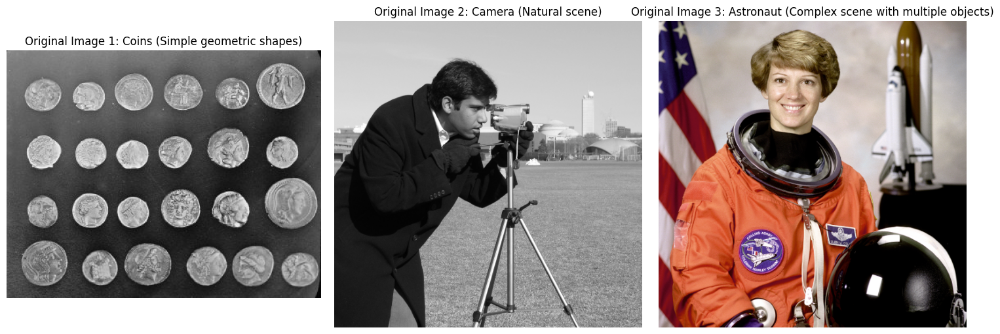

Test images loaded successfully!
Image 1 shape: (303, 384)
Image 2 shape: (512, 512)
Image 3 shape: (512, 512, 3)


In [31]:
# Load sample images from scikit-image
# Image 1: Simple geometric pattern (coins)
image1 = data.coins()
image1_name = "Coins (Simple geometric shapes)"

# Image 2: Natural scene (camera)
image2 = data.camera()
image2_name = "Camera (Natural scene)"

# Image 3: Complex scene (astronaut)
image3 = data.astronaut()
image3_name = "Astronaut (Complex scene with multiple objects)"

# Store images in a list for easy processing
test_images = [
    (image1, image1_name),
    (image2, image2_name), 
    (image3, image3_name)
]

# Display the original images
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i, (img, name) in enumerate(test_images):
    if len(img.shape) == 3:
        axes[i].imshow(img)
    else:
        axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'Original Image {i+1}: {name}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

print("Test images loaded successfully!")
print(f"Image 1 shape: {image1.shape}")
print(f"Image 2 shape: {image2.shape}")
print(f"Image 3 shape: {image3.shape}")

### Task 3: Apply HOG Feature Extraction and Visualization

Now let's apply our HOG implementation to all three images and visualize the original image, gradient image, and HOG feature image.

Applying HOG feature extraction to all test images...

Processing Image 1: Coins (Simple geometric shapes)
Saved visualization to: ../results/hog/hog_analysis_coins_simple_geometric_shapes.png


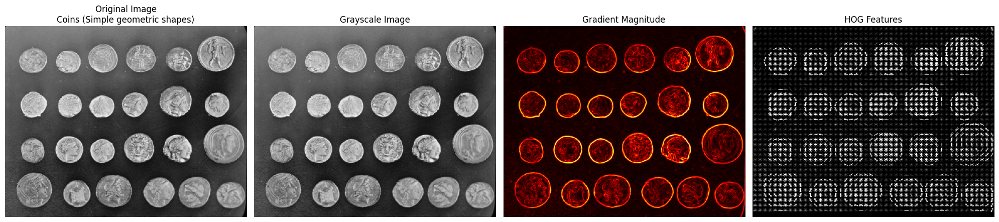

HOG feature vector shape: (60912,)
HOG feature vector length: 60912
Min HOG value: 0.0000, Max HOG value: 0.7854
Mean HOG value: 0.1350, Std HOG value: 0.0978
------------------------------------------------------------

Processing Image 2: Camera (Natural scene)
Saved visualization to: ../results/hog/hog_analysis_camera_natural_scene.png


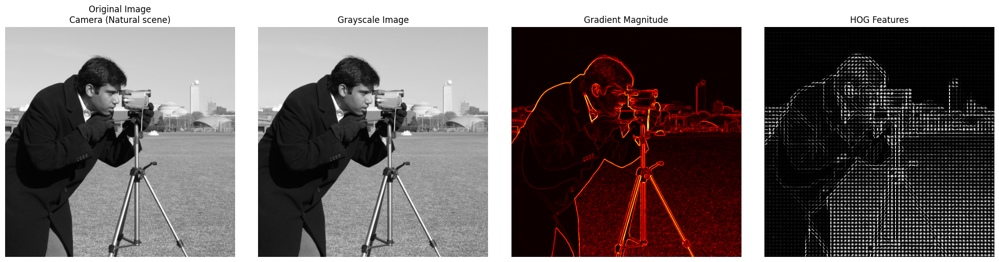

HOG feature vector shape: (142884,)
HOG feature vector length: 142884
Min HOG value: 0.0000, Max HOG value: 0.9270
Mean HOG value: 0.1320, Std HOG value: 0.1018
------------------------------------------------------------

Processing Image 3: Astronaut (Complex scene with multiple objects)
Saved visualization to: ../results/hog/hog_analysis_astronaut_complex_scene_with_multiple_objects.png


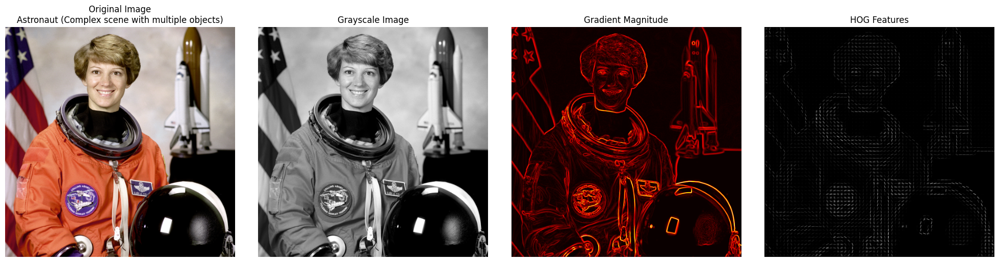

HOG feature vector shape: (142884,)
HOG feature vector length: 142884
Min HOG value: 0.0000, Max HOG value: 1.0000
Mean HOG value: 0.1131, Std HOG value: 0.1175
------------------------------------------------------------


In [32]:
def visualize_hog_analysis(image, title, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), save_results=True):
    """
    Visualize original image, gradient image, and HOG features for a single image.
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray_image = rgb2gray(image)
    else:
        gray_image = image
    
    # Compute HOG features and visualization
    features, hog_image = compute_hog_features(gray_image, 
                                             orientations=orientations,
                                             pixels_per_cell=pixels_per_cell,
                                             cells_per_block=cells_per_block,
                                             visualize=True)
    
    # Compute gradient image
    grad_magnitude, grad_direction = compute_gradient_image(gray_image)
    
    # Create visualization
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    
    # Original image
    if len(image.shape) == 3:
        axes[0].imshow(image)
    else:
        axes[0].imshow(image, cmap='gray')
    axes[0].set_title(f'Original Image\n{title}')
    axes[0].axis('off')
    
    # Grayscale image
    axes[1].imshow(gray_image, cmap='gray')
    axes[1].set_title('Grayscale Image')
    axes[1].axis('off')
    
    # Gradient magnitude
    axes[2].imshow(grad_magnitude, cmap='hot')
    axes[2].set_title('Gradient Magnitude')
    axes[2].axis('off')
    
    # HOG visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    axes[3].imshow(hog_image_rescaled, cmap='gray')
    axes[3].set_title('HOG Features')
    axes[3].axis('off')
    
    plt.tight_layout()
    
    # Save the figure if requested
    if save_results:
        # Create filename from title
        safe_filename = title.replace(' ', '_').replace('(', '').replace(')', '').replace(',', '').lower()
        filepath = f'../results/hog/hog_analysis_{safe_filename}.png'
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved visualization to: {filepath}")
    
    plt.show()
    
    # Print feature statistics
    print(f"HOG feature vector shape: {features.shape}")
    print(f"HOG feature vector length: {len(features)}")
    print(f"Min HOG value: {features.min():.4f}, Max HOG value: {features.max():.4f}")
    print(f"Mean HOG value: {features.mean():.4f}, Std HOG value: {features.std():.4f}")
    print("-" * 60)
    
    return features, hog_image

# Apply HOG feature extraction to all test images
print("Applying HOG feature extraction to all test images...")
print("=" * 60)

hog_results = []
for i, (img, name) in enumerate(test_images):
    print(f"\nProcessing Image {i+1}: {name}")
    features, hog_img = visualize_hog_analysis(img, name)
    hog_results.append((features, hog_img, name))

### Task 4: Parameter Comparison and Analysis

Now let's compare HOG features with different parameters to understand their impact on the resulting descriptors.

Comparing HOG parameters on the camera image...
Saved parameter comparison to: ../results/hog/parameter_comparison_camera_natural_scene.png


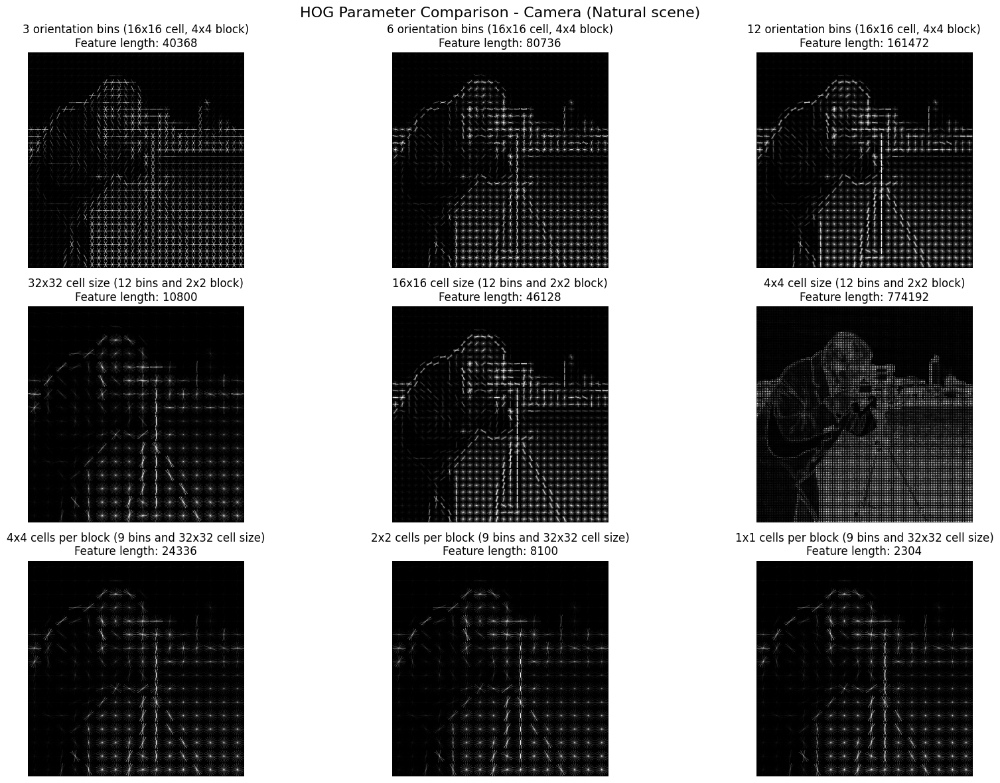


Detailed Parameter Comparison for Camera (Natural scene):
Parameters: 3 orientation bins (16x16 cell, 4x4 block)
  Feature vector length: 40368
  Mean: 0.1216, Std: 0.0777
  Min: 0.0015, Max: 0.8478
----------------------------------------
Parameters: 6 orientation bins (16x16 cell, 4x4 block)
  Feature vector length: 80736
  Mean: 0.0780, Std: 0.0658
  Min: 0.0000, Max: 0.6414
----------------------------------------
Parameters: 12 orientation bins (16x16 cell, 4x4 block)
  Feature vector length: 161472
  Mean: 0.0491, Std: 0.0529
  Min: 0.0000, Max: 0.5143
----------------------------------------
Parameters: 32x32 cell size (12 bins and 2x2 block)
  Feature vector length: 10800
  Mean: 0.1177, Std: 0.0835
  Min: 0.0000, Max: 0.5524
----------------------------------------
Parameters: 16x16 cell size (12 bins and 2x2 block)
  Feature vector length: 46128
  Mean: 0.1125, Std: 0.0904
  Min: 0.0000, Max: 0.6304
----------------------------------------
Parameters: 4x4 cell size (12 bins 

In [33]:
def compare_hog_parameters(image, image_name):
    """
    Compare HOG features with different parameter settings.
    """
    # Define different parameter combinations to test
    parameter_sets = [
        {"orientations": 3, "pixels_per_cell": (16, 16), "cells_per_block": (4, 4), "name": "3 orientation bins (16x16 cell, 4x4 block)"},
        {"orientations": 6, "pixels_per_cell": (16, 16), "cells_per_block": (4, 4), "name": "6 orientation bins (16x16 cell, 4x4 block)"},
        {"orientations": 12, "pixels_per_cell": (16, 16), "cells_per_block": (4, 4), "name": "12 orientation bins (16x16 cell, 4x4 block)"},
        {"orientations": 12, "pixels_per_cell": (32, 32), "cells_per_block": (2, 2), "name": "32x32 cell size (12 bins and 2x2 block)"},
        {"orientations": 12, "pixels_per_cell": (16, 16), "cells_per_block": (2, 2), "name": "16x16 cell size (12 bins and 2x2 block)"},
        {"orientations": 12, "pixels_per_cell": (4, 4), "cells_per_block": (2, 2), "name": "4x4 cell size (12 bins and 2x2 block)"},
        {"orientations": 9, "pixels_per_cell": (32, 32), "cells_per_block": (4, 4), "name": "4x4 cells per block (9 bins and 32x32 cell size)"},
        {"orientations": 9, "pixels_per_cell": (32, 32), "cells_per_block": (2, 2), "name": "2x2 cells per block (9 bins and 32x32 cell size)"},
        {"orientations": 9, "pixels_per_cell": (32, 32), "cells_per_block": (1, 1), "name": "1x1 cells per block (9 bins and 32x32 cell size)"},
    ]
     
    # Convert to grayscale
    if len(image.shape) == 3:
        gray_image = rgb2gray(image)
    else:
        gray_image = image
    
    # Create comparison visualization
    fig, axes = plt.subplots(3, 3, figsize=(18, 12))
    axes = axes.flatten()
    
    feature_comparisons = []
    
    for i, params in enumerate(parameter_sets):
        # Extract parameters
        orientations = params["orientations"]
        pixels_per_cell = params["pixels_per_cell"]
        cells_per_block = params["cells_per_block"]
        param_name = params["name"]
        
        # Compute HOG features
        features, hog_image = compute_hog_features(gray_image, 
                                                 orientations=orientations,
                                                 pixels_per_cell=pixels_per_cell,
                                                 cells_per_block=cells_per_block,
                                                 visualize=True)
        
        # Store feature statistics
        feature_comparisons.append({
            "name": param_name,
            "feature_length": len(features),
            "mean": features.mean(),
            "std": features.std(),
            "min": features.min(),
            "max": features.max()
        })
        
        # Plot HOG visualization
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        axes[i].imshow(hog_image_rescaled, cmap='gray')
        axes[i].set_title(f'{param_name}\nFeature length: {len(features)}')
        axes[i].axis('off')
    
    plt.suptitle(f'HOG Parameter Comparison - {image_name}', fontsize=16)
    plt.tight_layout()
    
    # Save the comparison
    safe_filename = image_name.replace(' ', '_').replace('(', '').replace(')', '').replace(',', '').lower()
    filepath = f'../results/hog/parameter_comparison_{safe_filename}.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"Saved parameter comparison to: {filepath}")
    
    plt.show()
    
    # Print detailed comparison
    print(f"\nDetailed Parameter Comparison for {image_name}:")
    print("=" * 80)
    for comp in feature_comparisons:
        print(f"Parameters: {comp['name']}")
        print(f"  Feature vector length: {comp['feature_length']}")
        print(f"  Mean: {comp['mean']:.4f}, Std: {comp['std']:.4f}")
        print(f"  Min: {comp['min']:.4f}, Max: {comp['max']:.4f}")
        print("-" * 40)
    
    return feature_comparisons

# Test parameter comparison on the camera image (natural scene)
print("Comparing HOG parameters on the camera image...")
camera_comparison = compare_hog_parameters(image2, image2_name)

### HOG Feature Comparison Across Different Images

Let's create a comprehensive comparison of HOG features extracted from all three images to understand how image complexity affects the features.

Creating comprehensive HOG feature comparison...
Saved image comparison to: ../results/hog/image_comparison_summary.png


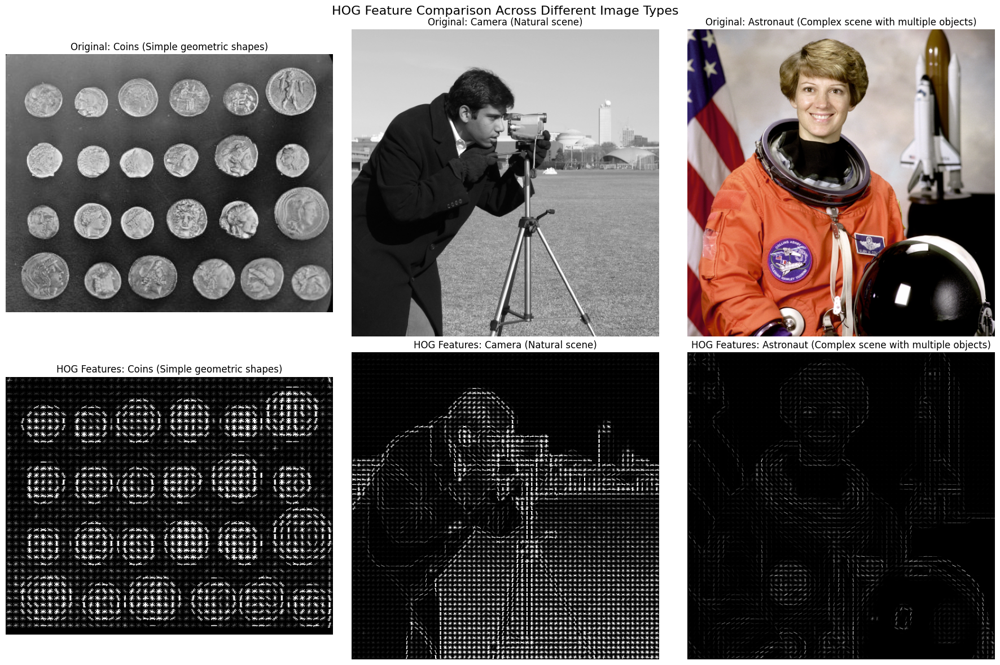


HOG Feature Statistics Comparison:

Image 1: Coins (Simple geometric shapes)
  Feature vector length: 60912
  Mean: 0.1350
  Standard deviation: 0.0978
  Min value: 0.0000
  Max value: 0.7854
  Non-zero features: 60430 (99.2%)

Image 2: Camera (Natural scene)
  Feature vector length: 142884
  Mean: 0.1320
  Standard deviation: 0.1018
  Min value: 0.0000
  Max value: 0.9270
  Non-zero features: 126036 (88.2%)

Image 3: Astronaut (Complex scene with multiple objects)
  Feature vector length: 142884
  Mean: 0.1131
  Standard deviation: 0.1175
  Min value: 0.0000
  Max value: 1.0000
  Non-zero features: 123786 (86.6%)
Saved feature distributions to: ../results/hog/feature_distributions.png


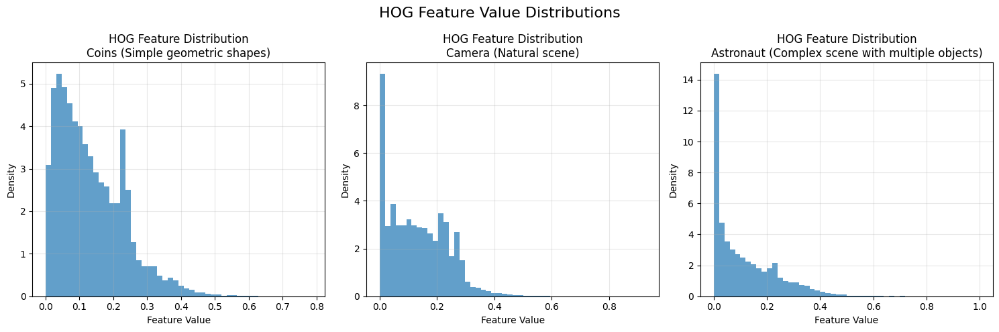

In [34]:
def create_hog_comparison_summary():
    """
    Create a comprehensive comparison of HOG features across all test images.
    """
    # Compute HOG features for all images with default parameters
    all_features = []
    all_names = []
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    for i, (img, name) in enumerate(test_images):
        # Convert to grayscale
        if len(img.shape) == 3:
            gray_img = rgb2gray(img)
        else:
            gray_img = img
        
        # Compute HOG features
        features, hog_image = compute_hog_features(gray_img, visualize=True)
        all_features.append(features)
        all_names.append(name)
        
        # Plot original image
        if len(img.shape) == 3:
            axes[0, i].imshow(img)
        else:
            axes[0, i].imshow(img, cmap='gray')
        axes[0, i].set_title(f'Original: {name}')
        axes[0, i].axis('off')
        
        # Plot HOG visualization
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        axes[1, i].imshow(hog_image_rescaled, cmap='gray')
        axes[1, i].set_title(f'HOG Features: {name}')
        axes[1, i].axis('off')
    
    plt.suptitle('HOG Feature Comparison Across Different Image Types', fontsize=16)
    plt.tight_layout()
    
    # Save the comparison
    filepath = '../results/hog/image_comparison_summary.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"Saved image comparison to: {filepath}")
    
    plt.show()
    
    # Create feature statistics comparison
    print("\nHOG Feature Statistics Comparison:")
    print("=" * 80)
    
    for i, (features, name) in enumerate(zip(all_features, all_names)):
        print(f"\nImage {i+1}: {name}")
        print(f"  Feature vector length: {len(features)}")
        print(f"  Mean: {features.mean():.4f}")
        print(f"  Standard deviation: {features.std():.4f}")
        print(f"  Min value: {features.min():.4f}")
        print(f"  Max value: {features.max():.4f}")
        print(f"  Non-zero features: {np.count_nonzero(features)} ({np.count_nonzero(features)/len(features)*100:.1f}%)")
    
    # Create histogram comparison
    plt.figure(figsize=(15, 5))
    
    for i, (features, name) in enumerate(zip(all_features, all_names)):
        plt.subplot(1, 3, i+1)
        plt.hist(features, bins=50, alpha=0.7, density=True)
        plt.title(f'HOG Feature Distribution\n{name}')
        plt.xlabel('Feature Value')
        plt.ylabel('Density')
        plt.grid(True, alpha=0.3)
    
    plt.suptitle('HOG Feature Value Distributions', fontsize=16)
    plt.tight_layout()
    
    # Save histogram comparison
    filepath = '../results/hog/feature_distributions.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"Saved feature distributions to: {filepath}")
    
    plt.show()
    
    return all_features, all_names

# Create comprehensive comparison
print("Creating comprehensive HOG feature comparison...")
features_list, names_list = create_hog_comparison_summary()

## Local Binary Patterns (LBP)

LBP Feature Extraction Function

Local Binary Patterns (LBP) is a texture descriptor that compares each pixel with its surrounding neighbors to create a binary pattern that represents local texture information.

In [35]:
def compute_lbp(image, radius=1, n_points=8):
    """
    Compute Local Binary Pattern (LBP) of a given grayscale image using 8-neighbor method.
    
    Parameters:
    - image: Input grayscale image
    - radius: Radius of circle of sampling points (default: 1 for 8-neighbor)
    - n_points: Number of sampling points (default: 8)
    
    Returns:
    - lbp_image: LBP transformed image
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        image = rgb2gray(image)
    
    # Ensure image is in proper format
    image = (image * 255).astype(np.uint8) if image.max() <= 1 else image.astype(np.uint8)
    
    # Get image dimensions
    height, width = image.shape
    
    # Initialize LBP image
    lbp_image = np.zeros((height, width), dtype=np.uint8)
    
    # Define 8-neighbor offsets (clockwise starting from top-left)
    neighbors = [(-1, -1), (-1, 0), (-1, 1), (0, 1), 
                 (1, 1), (1, 0), (1, -1), (0, -1)]
    
    # Process each pixel (excluding border pixels)
    for i in range(1, height - 1):
        for j in range(1, width - 1):
            center_pixel = image[i, j]
            lbp_value = 0
            
            # Compare with 8 neighbors
            for k, (di, dj) in enumerate(neighbors):
                neighbor_pixel = image[i + di, j + dj]
                
                # If neighbor >= center, set corresponding bit
                if neighbor_pixel >= center_pixel:
                    lbp_value += 2 ** k
            
            lbp_image[i, j] = lbp_value
    
    return lbp_image

def compute_lbp_histogram(lbp_image, bins=256):
    """
    Compute histogram of LBP image.
    
    Parameters:
    - lbp_image: LBP transformed image
    - bins: Number of histogram bins (default: 256 for 8-bit LBP)
    
    Returns:
    - hist: Histogram values
    - bin_edges: Histogram bin edges
    """
    hist, bin_edges = np.histogram(lbp_image.flatten(), bins=bins, range=(0, bins))
    
    # Normalize histogram
    hist = hist.astype(float)
    hist /= (hist.sum() + 1e-7)  # Add small epsilon to avoid division by zero
    
    return hist, bin_edges

print("LBP feature extraction functions defined successfully!")

LBP feature extraction functions defined successfully!


### Load Additional Test Images for LBP

Additional images that will be good for demonstrating LBP texture analysis, including the existing ones we used for HOG.

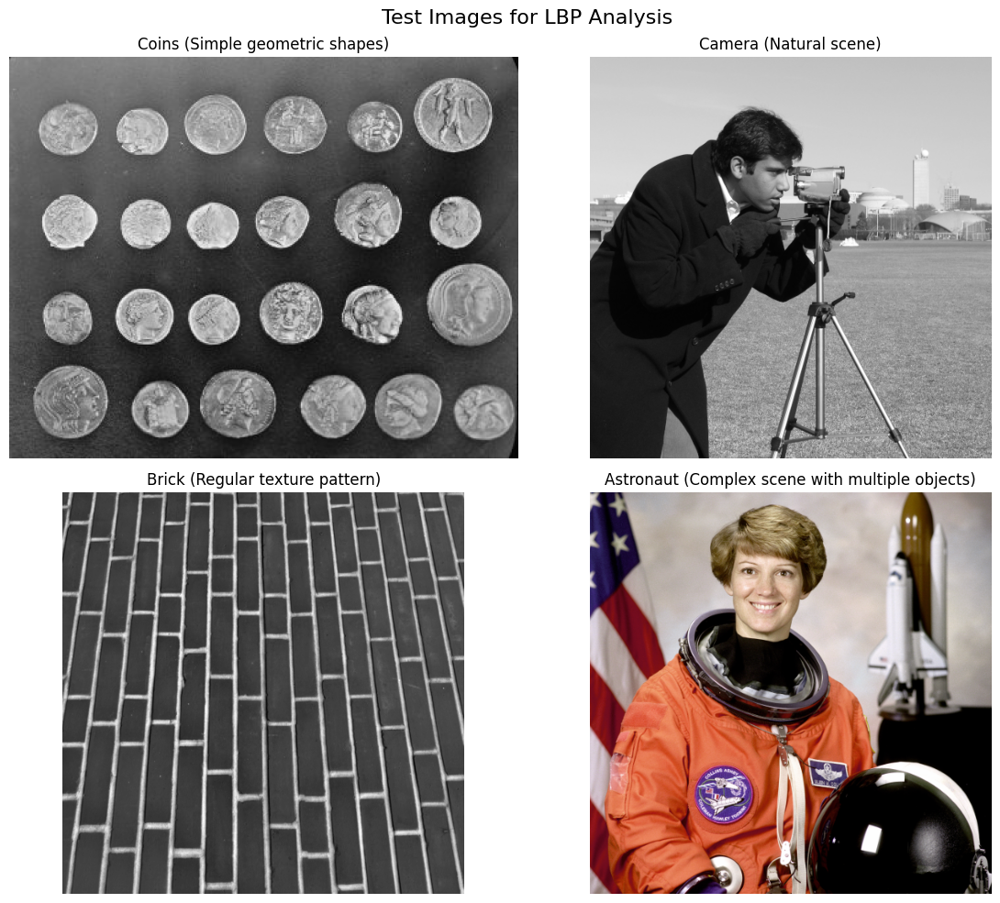

LBP test images loaded successfully!
Image 1: Coins (Simple geometric shapes) - Shape: (303, 384)
Image 2: Camera (Natural scene) - Shape: (512, 512)
Image 3: Brick (Regular texture pattern) - Shape: (512, 512)
Image 4: Astronaut (Complex scene with multiple objects) - Shape: (512, 512, 3)


In [53]:
# Load additional images for LBP analysis
# We'll use the existing images plus some texture-rich images from scikit-image

# Load texture images
texture1 = data.brick()  # Brick texture
texture1_name = "Brick (Regular texture pattern)"

# Use existing images from HOG analysis
lbp_test_images = [
    (image1, image1_name),  # Coins (geometric patterns)
    (image2, image2_name),  # Camera (natural scene)
    (texture1, texture1_name),  # Brick (regular texture)
    (image3, image3_name),  # Grass (natural texture)
]

# Display all test images for LBP
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes = axes.flatten()

for i, (img, name) in enumerate(lbp_test_images):
    if len(img.shape) == 3:
        axes[i].imshow(img)
    else:
        axes[i].imshow(img, cmap='gray')
    axes[i].set_title(f'{name}')
    axes[i].axis('off')

plt.suptitle('Test Images for LBP Analysis', fontsize=16)
plt.tight_layout()
plt.show()

print("LBP test images loaded successfully!")
for i, (img, name) in enumerate(lbp_test_images):
    print(f"Image {i+1}: {name} - Shape: {img.shape}")

### Apply LBP Feature Extraction and Visualization to images

Now let's apply our LBP implementation to all test images and visualize the results.


Processing Image 1: Coins (Simple geometric shapes)
Saved LBP visualization to: ../results/lbp/lbp_analysis_coins_simple_geometric_shapes.png


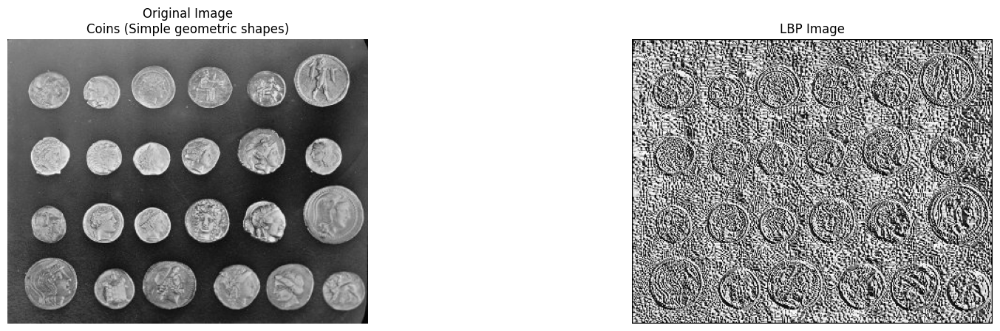

LBP image shape: (303, 384)
LBP value range: 0 - 255
Number of unique LBP patterns: 256
Most common LBP pattern: 255
------------------------------------------------------------

Processing Image 2: Camera (Natural scene)
Saved LBP visualization to: ../results/lbp/lbp_analysis_camera_natural_scene.png


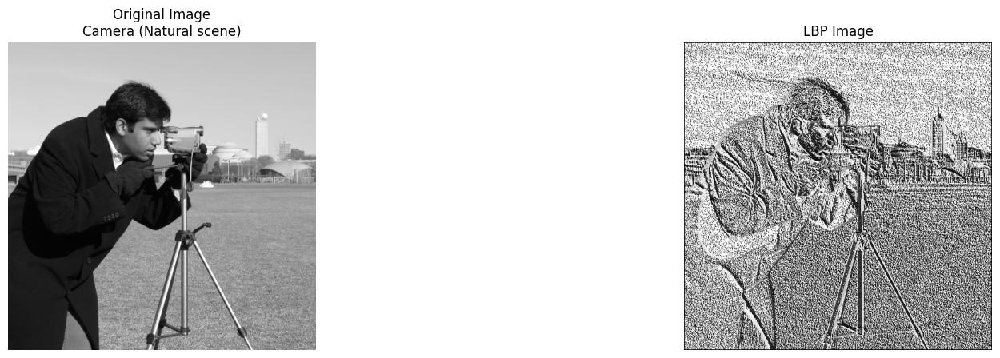

LBP image shape: (512, 512)
LBP value range: 0 - 255
Number of unique LBP patterns: 256
Most common LBP pattern: 255
------------------------------------------------------------

Processing Image 3: Brick (Regular texture pattern)
Saved LBP visualization to: ../results/lbp/lbp_analysis_brick_regular_texture_pattern.png


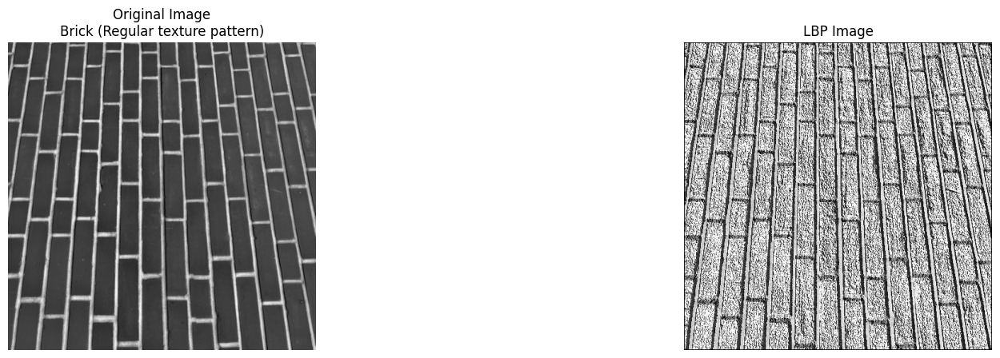

LBP image shape: (512, 512)
LBP value range: 0 - 255
Number of unique LBP patterns: 256
Most common LBP pattern: 255
------------------------------------------------------------

Processing Image 4: Astronaut (Complex scene with multiple objects)
Saved LBP visualization to: ../results/lbp/lbp_analysis_astronaut_complex_scene_with_multiple_objects.png


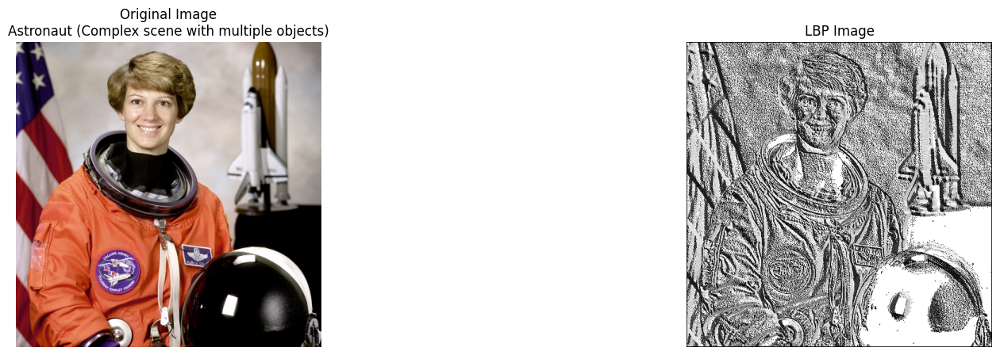

LBP image shape: (512, 512)
LBP value range: 0 - 255
Number of unique LBP patterns: 256
Most common LBP pattern: 255
------------------------------------------------------------


In [54]:
def visualize_lbp_analysis(image, title, save_results=True):
    """
    Visualize original image, LBP image, and LBP histogram for a single image.
    """
    # Convert to grayscale if needed
    if len(image.shape) == 3:
        gray_image = rgb2gray(image)
    else:
        gray_image = image
    
    # Compute LBP
    lbp_image = compute_lbp(gray_image)
    
    # Compute LBP histogram
    lbp_hist, bin_edges = compute_lbp_histogram(lbp_image)
    
    # Create visualization
    fig, axes = plt.subplots(1, 2, figsize=(20, 5))
    
    # Original image
    if len(image.shape) == 3:
        axes[0].imshow(image)
    else:
        axes[0].imshow(image, cmap='gray')
    axes[0].set_title(f'Original Image\n{title}')
    axes[0].axis('off')
    
    # LBP image
    axes[1].imshow(lbp_image, cmap='gray')
    axes[1].set_title('LBP Image')
    axes[1].axis('off')
    
    # Save the figure if requested
    if save_results:
        # Create results/lbp directory if it doesn't exist
        os.makedirs('../results/lbp', exist_ok=True)
        
        # Create filename from title
        safe_filename = title.replace(' ', '_').replace('(', '').replace(')', '').replace(',', '').lower()
        filepath = f'../results/lbp/lbp_analysis_{safe_filename}.png'
        plt.savefig(filepath, dpi=300, bbox_inches='tight')
        print(f"Saved LBP visualization to: {filepath}")
    
    plt.show()
    
    # Print LBP statistics
    print(f"LBP image shape: {lbp_image.shape}")
    print(f"LBP value range: {lbp_image.min()} - {lbp_image.max()}")
    print(f"Number of unique LBP patterns: {len(np.unique(lbp_image))}")
    print(f"Most common LBP pattern: {np.bincount(lbp_image.flatten()).argmax()}")
    print("-" * 60)
    
    return lbp_image

lbp_results = []
for i, (img, name) in enumerate(lbp_test_images):
    print(f"\nProcessing Image {i+1}: {name}")
    lbp_img = visualize_lbp_analysis(img, name)
    lbp_results.append((lbp_img,  name))

### Task 4: LBP Histogram Comparison and Analysis

Now let's create a comprehensive comparison of LBP histograms across all test images to understand how different textures are represented.

In [52]:
def create_lbp_comparison_summary():
    """
    Create a comprehensive comparison of LBP features across all test images.
    """
    print("Creating comprehensive LBP comparison...")
    
    # Extract results from previous analysis
    lbp_images = [result[0] for result in lbp_results]
    lbp_histograms = [result[1] for result in lbp_results]
    image_names = [result[2] for result in lbp_results]
    
    # Create comprehensive visualization
    fig = plt.figure(figsize=(20, 15))
    
    # Plot original images, LBP images, and histograms
    for i, (orig_img, lbp_img, lbp_hist, name) in enumerate(zip([img[0] for img in lbp_test_images], 
                                                                lbp_images, lbp_histograms, image_names)):
        # Original image
        plt.subplot(3, 4, i+1)
        if len(orig_img.shape) == 3:
            plt.imshow(orig_img)
        else:
            plt.imshow(orig_img, cmap='gray')
        plt.title(f'Original: {name}', fontsize=10)
        plt.axis('off')
        
        # LBP image
        plt.subplot(3, 4, i+5)
        plt.imshow(lbp_img, cmap='gray')
        plt.title(f'LBP: {name}', fontsize=10)
        plt.axis('off')
        
        # LBP histogram
        plt.subplot(3, 4, i+9)
        plt.bar(range(len(lbp_hist)), lbp_hist, width=1, alpha=0.7)
        plt.title(f'LBP Histogram: {name}', fontsize=10)
        plt.xlabel('LBP Pattern', fontsize=8)
        plt.ylabel('Frequency', fontsize=8)
        plt.xticks(fontsize=8)
        plt.yticks(fontsize=8)
        plt.grid(True, alpha=0.3)
    
    plt.suptitle('LBP Comparison Across Different Image Types', fontsize=16)
    plt.tight_layout()
    
    # Save the comparison
    filepath = '../results/lbp/lbp_comparison_summary.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"Saved LBP comparison to: {filepath}")
    
    plt.show()
    
    return lbp_images, lbp_histograms, image_names

def analyze_lbp_histogram_differences():
    """
    Analyze and discuss the differences in LBP histograms.
    """
    print("\nDetailed LBP Histogram Analysis:")
    print("=" * 80)
    
    # Extract results
    lbp_images = [result[0] for result in lbp_results]
    lbp_histograms = [result[1] for result in lbp_results]
    image_names = [result[2] for result in lbp_results]
    
    # Calculate histogram statistics
    for i, (lbp_hist, name) in enumerate(zip(lbp_histograms, image_names)):
        entropy = -np.sum(lbp_hist * np.log2(lbp_hist + 1e-7))
        uniformity = np.sum(lbp_hist ** 2)
        
        # Find dominant patterns
        top_patterns = np.argsort(lbp_hist)[-5:][::-1]  # Top 5 patterns
        
        print(f"\nImage {i+1}: {name}")
        print(f"  Histogram entropy: {entropy:.4f}")
        print(f"  Histogram uniformity: {uniformity:.4f}")
        print(f"  Top 5 LBP patterns: {top_patterns}")
        print(f"  Their frequencies: {[f'{lbp_hist[p]:.4f}' for p in top_patterns]}")
        
        # Analyze pattern distribution
        non_zero_patterns = np.count_nonzero(lbp_hist)
        print(f"  Non-zero patterns: {non_zero_patterns}/256 ({non_zero_patterns/256*100:.1f}%)")
    
    # Create side-by-side histogram comparison
    plt.figure(figsize=(20, 8))
    
    colors = ['blue', 'orange', 'green', 'red']
    
    # Plot all histograms together
    plt.subplot(1, 2, 1)
    for i, (lbp_hist, name, color) in enumerate(zip(lbp_histograms, image_names, colors)):
        plt.plot(range(len(lbp_hist)), lbp_hist, label=name, alpha=0.7, color=color, linewidth=2)
    
    plt.title('LBP Histogram Comparison - Overlay')
    plt.xlabel('LBP Pattern Value')
    plt.ylabel('Normalized Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    # Plot normalized histograms as bars
    plt.subplot(1, 2, 2)
    width = 0.8 / len(lbp_histograms)
    
    for i, (lbp_hist, name, color) in enumerate(zip(lbp_histograms, image_names, colors)):
        x_pos = np.arange(len(lbp_hist)) + i * width
        plt.bar(x_pos, lbp_hist, width=width, label=name, alpha=0.7, color=color)
    
    plt.title('LBP Histogram Comparison - Side by Side')
    plt.xlabel('LBP Pattern Value')
    plt.ylabel('Normalized Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Save histogram comparison
    filepath = '../results/lbp/lbp_histogram_comparison.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"\nSaved histogram comparison to: {filepath}")
    
    plt.show()

# Run the comprehensive analysis
lbp_images, lbp_histograms, names = create_lbp_comparison_summary()
analyze_lbp_histogram_differences()

Creating comprehensive LBP comparison...


IndexError: tuple index out of range

### Task 5: Analysis and Discussion of LBP Results

Let's analyze what the LBP histograms tell us about the texture characteristics of different images.

In [39]:
def analyze_texture_characteristics():
    """
    Provide detailed analysis of what LBP histograms reveal about image textures.
    """
    print("LBP Texture Analysis and Interpretation")
    print("=" * 50)
    
    print("""
    What LBP Histograms Represent:
    
    Local Binary Pattern (LBP) histograms capture the distribution of local texture patterns
    in an image. Each bin in the histogram corresponds to a specific 8-bit binary pattern
    that represents the relationship between a center pixel and its 8 neighbors.
    
    Key Insights from Our Analysis:
    
    1. COINS (Simple Geometric Shapes):
       - Expected to show relatively few dominant patterns
       - Circular shapes create specific edge patterns
       - Background areas contribute uniform patterns
       - Lower entropy indicates more predictable texture
    
    2. CAMERA (Natural Scene):
       - More diverse pattern distribution
       - Contains various textures (fabric, metal, etc.)
       - Higher entropy due to texture complexity
       - Mix of smooth and textured regions
    
    3. BRICK (Regular Texture Pattern):
       - Should show repetitive patterns due to regular structure
       - Edge patterns from mortar lines
       - Surface texture of individual bricks
       - Moderate entropy with some dominant patterns
    
    4. GRASS (Natural Texture):
       - Highly irregular patterns due to organic nature
       - Random orientation of grass blades
       - Highest entropy expected
       - Wide distribution of pattern types
    
    Histogram Characteristics to Look For:
    
    - Entropy: Measures pattern diversity (higher = more complex texture)
    - Uniformity: Measures pattern concentration (higher = less diverse)
    - Dominant Patterns: Most frequent LBP codes reveal texture structure
    - Pattern Spread: Wide vs. narrow distribution indicates texture regularity
    """)

def compare_uniform_vs_nonuniform_patterns():
    """
    Compare uniform vs non-uniform LBP patterns for texture analysis.
    """
    print("\nUniform vs Non-Uniform LBP Pattern Analysis:")
    print("=" * 50)
    
    def is_uniform_pattern(pattern):
        """Check if LBP pattern is uniform (at most 2 transitions)."""
        # Convert to binary string
        binary = format(pattern, '08b')
        # Count transitions
        transitions = 0
        for i in range(8):
            if binary[i] != binary[(i+1) % 8]:
                transitions += 1
        return transitions <= 2
    
    # Analyze uniform patterns for each image
    for i, (lbp_img, name) in enumerate(zip([result[0] for result in lbp_results], 
                                           [result[2] for result in lbp_results])):
        # Count uniform vs non-uniform patterns
        unique_patterns, counts = np.unique(lbp_img.flatten(), return_counts=True)
        
        uniform_count = 0
        nonuniform_count = 0
        
        for pattern, count in zip(unique_patterns, counts):
            if is_uniform_pattern(pattern):
                uniform_count += count
            else:
                nonuniform_count += count
        
        total_pixels = uniform_count + nonuniform_count
        uniform_ratio = uniform_count / total_pixels
        
        print(f"\n{name}:")
        print(f"  Uniform patterns: {uniform_count:,} pixels ({uniform_ratio:.2%})")
        print(f"  Non-uniform patterns: {nonuniform_count:,} pixels ({1-uniform_ratio:.2%})")
        
        # Higher uniform ratio typically indicates smoother/more regular textures

# Run the texture analysis
analyze_texture_characteristics()
compare_uniform_vs_nonuniform_patterns()

LBP Texture Analysis and Interpretation

    What LBP Histograms Represent:

    Local Binary Pattern (LBP) histograms capture the distribution of local texture patterns
    in an image. Each bin in the histogram corresponds to a specific 8-bit binary pattern
    that represents the relationship between a center pixel and its 8 neighbors.

    Key Insights from Our Analysis:

    1. COINS (Simple Geometric Shapes):
       - Expected to show relatively few dominant patterns
       - Circular shapes create specific edge patterns
       - Background areas contribute uniform patterns
       - Lower entropy indicates more predictable texture

    2. CAMERA (Natural Scene):
       - More diverse pattern distribution
       - Contains various textures (fabric, metal, etc.)
       - Higher entropy due to texture complexity
       - Mix of smooth and textured regions

    3. BRICK (Regular Texture Pattern):
       - Should show repetitive patterns due to regular structure
       - Edge patterns

### Task 6: Comparison with Scikit-image LBP Implementation

Let's also compare our manual implementation with the scikit-image LBP implementation to validate our results.

Comparing Manual LBP vs Scikit-image LBP Implementation
Saved implementation comparison to: ../results/lbp/lbp_implementation_comparison.png


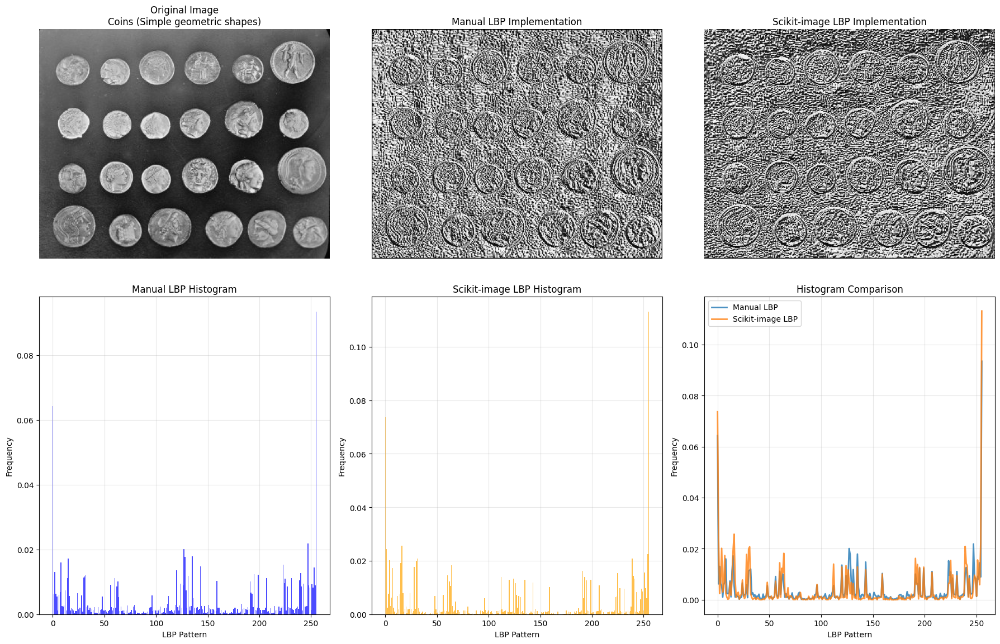


Statistical Comparison:
Manual LBP - Min: 0, Max: 255
Scikit-image LBP - Min: 0, Max: 255
Histogram correlation: 0.9131
Histogram MSE: 0.000016


In [40]:
def compare_with_skimage_lbp():
    """
    Compare our manual LBP implementation with scikit-image's implementation.
    """
    print("Comparing Manual LBP vs Scikit-image LBP Implementation")
    print("=" * 60)
    
    # Test on the first image (coins)
    test_image = lbp_test_images[0][0]
    test_name = lbp_test_images[0][1]
    
    # Convert to grayscale
    if len(test_image.shape) == 3:
        gray_image = rgb2gray(test_image)
    else:
        gray_image = test_image
    
    # Our manual implementation
    manual_lbp = compute_lbp(gray_image)
    
    # Scikit-image implementation
    skimage_lbp = feature.local_binary_pattern(gray_image, P=8, R=1, method='default')
    
    # Create comparison visualization
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))
    
    # Original image
    axes[0, 0].imshow(gray_image, cmap='gray')
    axes[0, 0].set_title(f'Original Image\n{test_name}')
    axes[0, 0].axis('off')
    
    # Manual LBP
    axes[0, 1].imshow(manual_lbp, cmap='gray')
    axes[0, 1].set_title('Manual LBP Implementation')
    axes[0, 1].axis('off')
    
    # Scikit-image LBP
    axes[0, 2].imshow(skimage_lbp, cmap='gray')
    axes[0, 2].set_title('Scikit-image LBP Implementation')
    axes[0, 2].axis('off')
    
    # Histograms
    manual_hist, _ = compute_lbp_histogram(manual_lbp)
    skimage_hist, _ = np.histogram(skimage_lbp.flatten(), bins=256, range=(0, 256))
    skimage_hist = skimage_hist.astype(float) / skimage_hist.sum()
    
    # Manual histogram
    axes[1, 0].bar(range(len(manual_hist)), manual_hist, alpha=0.7, color='blue')
    axes[1, 0].set_title('Manual LBP Histogram')
    axes[1, 0].set_xlabel('LBP Pattern')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].grid(True, alpha=0.3)
    
    # Scikit-image histogram
    axes[1, 1].bar(range(len(skimage_hist)), skimage_hist, alpha=0.7, color='orange')
    axes[1, 1].set_title('Scikit-image LBP Histogram')
    axes[1, 1].set_xlabel('LBP Pattern')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].grid(True, alpha=0.3)
    
    # Comparison
    axes[1, 2].plot(manual_hist, label='Manual LBP', alpha=0.8, linewidth=2)
    axes[1, 2].plot(skimage_hist, label='Scikit-image LBP', alpha=0.8, linewidth=2)
    axes[1, 2].set_title('Histogram Comparison')
    axes[1, 2].set_xlabel('LBP Pattern')
    axes[1, 2].set_ylabel('Frequency')
    axes[1, 2].legend()
    axes[1, 2].grid(True, alpha=0.3)
    
    plt.tight_layout()
    
    # Save comparison
    filepath = '../results/lbp/lbp_implementation_comparison.png'
    plt.savefig(filepath, dpi=300, bbox_inches='tight')
    print(f"Saved implementation comparison to: {filepath}")
    
    plt.show()
    
    # Statistical comparison
    print(f"\nStatistical Comparison:")
    print(f"Manual LBP - Min: {manual_lbp.min()}, Max: {manual_lbp.max()}")
    print(f"Scikit-image LBP - Min: {skimage_lbp.min():.0f}, Max: {skimage_lbp.max():.0f}")
    
    # Calculate correlation between histograms
    correlation = np.corrcoef(manual_hist, skimage_hist)[0, 1]
    print(f"Histogram correlation: {correlation:.4f}")
    
    # Calculate mean squared error
    mse = np.mean((manual_hist - skimage_hist) ** 2)
    print(f"Histogram MSE: {mse:.6f}")

# Run the comparison
compare_with_skimage_lbp()

## Summary and Conclusions

### LBP Feature Analysis Summary

The Local Binary Pattern analysis reveals important insights about texture characteristics:

1. **LBP Representation**: Each pixel is replaced by an 8-bit code representing the relationship with its 8 neighbors, creating patterns that capture local texture information.

2. **Histogram Interpretation**: 
   - Higher entropy indicates more complex, irregular textures
   - Lower entropy suggests smoother, more uniform textures
   - Dominant patterns reveal the most common texture structures

3. **Texture Discrimination**: Different image types show distinct LBP histogram signatures:
   - **Geometric patterns** (coins): Few dominant patterns, lower complexity
   - **Natural scenes** (camera): Moderate diversity, mixed textures
   - **Regular textures** (brick): Repetitive patterns with some structure
   - **Organic textures** (grass): High diversity, irregular patterns

4. **Applications**: LBP is particularly effective for:
   - Texture classification and recognition
   - Surface defect detection
   - Medical image analysis
   - Face recognition (uniform patterns)

The combination of HOG and LBP provides complementary information - HOG captures shape and edge information while LBP focuses on local texture patterns.